<a href="https://colab.research.google.com/github/ahmadrmdhann/PCVK_Ganjil_2025/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## 1. Transformasi Linier Brightness

Formula: g(x,y)=f(x,y)+b

g(x,y) adalah nilai pixel setelah transformasi, f(x,y) adalah nilai pixel asli, b adalah nilai brightness

In [3]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 163


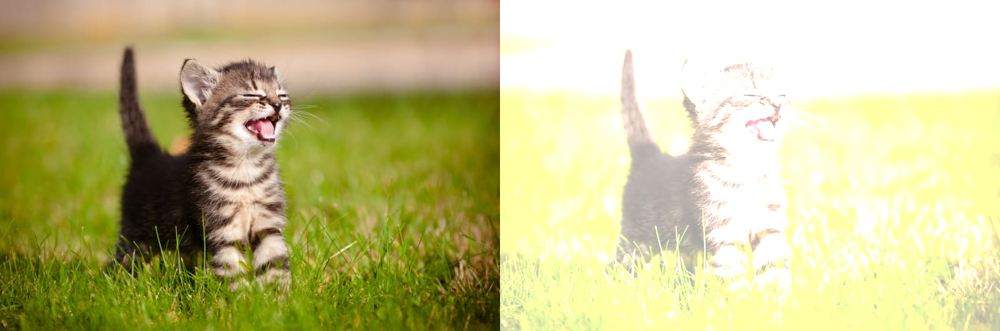

In [5]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(int(original[y, x, c]) + brightness, 0, 255).astype(original.dtype)

# cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat([original, brightness_image])
cv2_imshow(final_frame)

## Tugas

1. Implement image inverse in your code using formula shown in the theoretical background subsection above, giving the output shown in the following figure:

 Mengubah citra menjadi invers 
----------------------------------


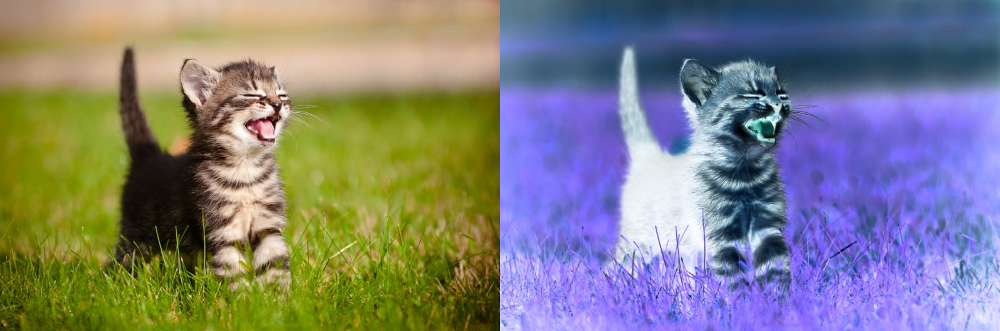

In [6]:
print(' Mengubah citra menjadi invers ')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
inverse_image = 255 - original

final_frame_inverse = cv.hconcat([original, inverse_image])
cv2_imshow(final_frame_inverse)

2. Implement contrast transformation in Google Collaboratory using the formula written in the Theoretical background section, giving the output shown in the following figure:

 Mengubah tingkat kecerahan dan kontras citra 
----------------------------------------------
Masukkan nilai kecerahan [-255 - 255]: -78
Masukkan nilai kontras [1.0 - 3.0]: 2.6


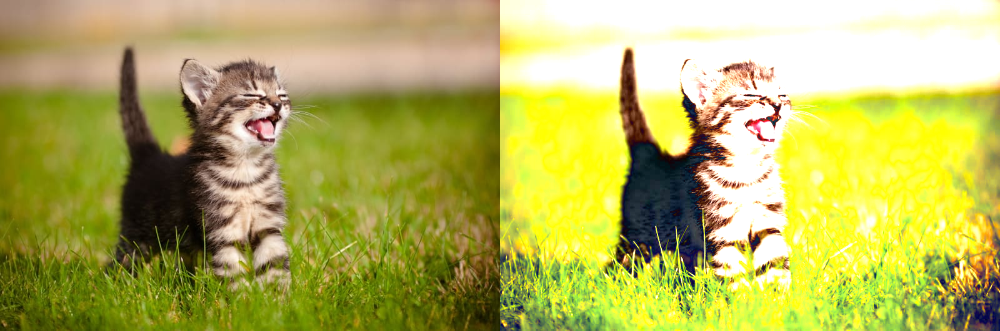

In [7]:
print(' Mengubah tingkat kecerahan dan kontras citra ')
print('----------------------------------------------')

try:
    brightness = int(input('Masukkan nilai kecerahan [-255 - 255]: '))
    if not (-255 <= brightness <= 255):
        print("Nilai kecerahan di luar rentang yang diizinkan.")
        brightness = 0
except ValueError:
    print('Error, nilai kecerahan bukan angka')
    brightness = 0

try:
    contrast = float(input('Masukkan nilai kontras [1.0 - 3.0]: '))
    if not (1.0 <= contrast <= 3.0):
        print("Nilai kontras di luar rentang yang diizinkan.")
        contrast = 1.0
except ValueError:
    print('Error, nilai kontras bukan angka')
    contrast = 1.0


original = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')

# Apply brightness and contrast transformations
# g(x,y) = alpha * f(x,y) + beta
# where alpha is contrast and beta is brightness
transformed_image = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)


final_frame_transformed = cv.hconcat([original, transformed_image])
cv2_imshow(final_frame_transformed)

3. Implement transformation of logarithmic brightness on Google Colaboratory using the formula written in the Theoretical Background Reviews, generating output shown in the following figure:

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 145
Hasil Transformasi Log dengan nilai kecerahan 145


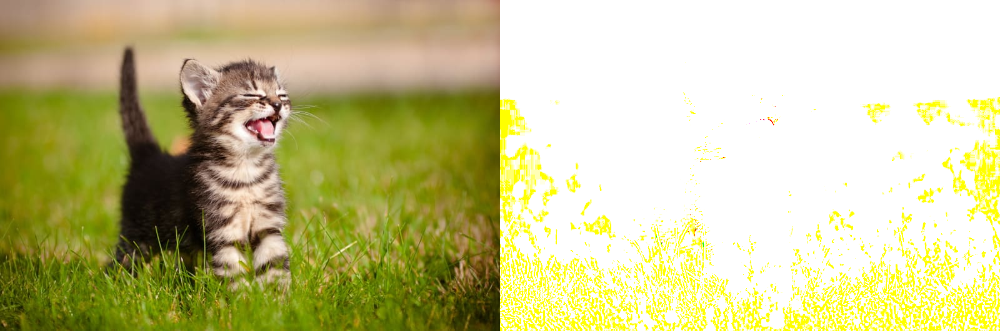

In [9]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('--------------------------------------------------------')

# Input
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')
    brightness = 40   # default

original = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
# Transformasi Logaritmik
log_image = np.log1p(original.astype(np.float32))   # log(1 + r)
# Normalisasi
log_image = cv.normalize(log_image, None, 0, 255, cv.NORM_MINMAX)
log_image = np.array(log_image, dtype=np.uint8)

# Brightnesss
log_image = cv.convertScaleAbs(log_image, alpha=brightness/40.0, beta=0)

final_frame = cv.hconcat([original, log_image])

print(f"Hasil Transformasi Log dengan nilai kecerahan {brightness}")
cv2_imshow(final_frame)


4. a. Grayscale Averaging

4a. Grayscale Averaging


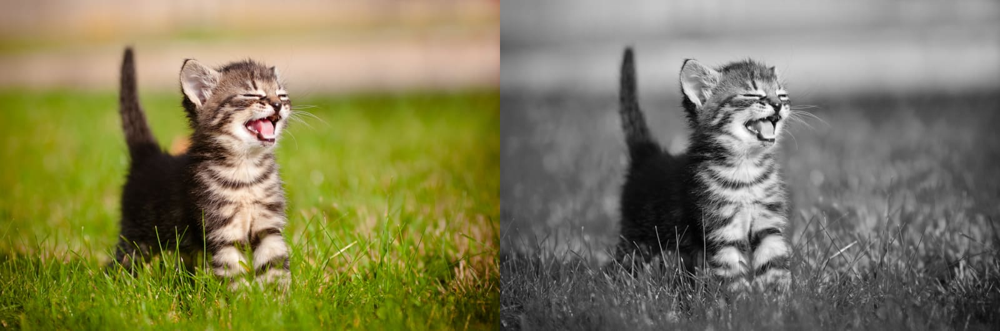

In [11]:
# Grayscale avg
gray_avg = np.mean(original, axis=2).astype(np.uint8)
print("4a. Grayscale Averaging")
cv2_imshow(cv.hconcat([original, cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)]))


4. b. Grayscale Lightness

4b. Grayscale Lightness


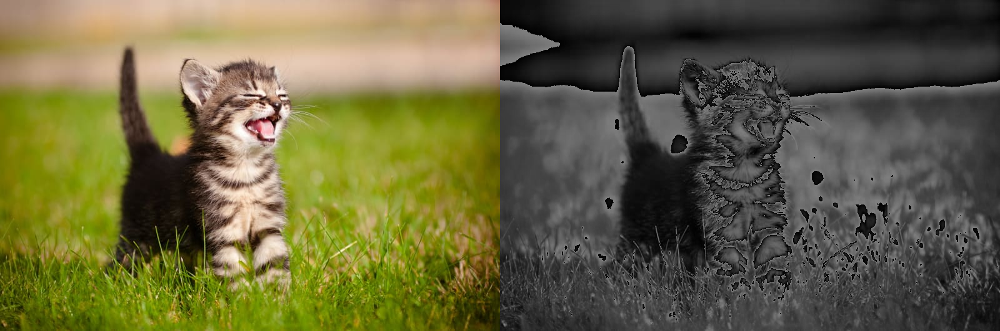

In [12]:
gray_lightness = ((np.max(original, axis=2) + np.min(original, axis=2)) / 2).astype(np.uint8)
print("4b. Grayscale Lightness")
cv2_imshow(cv.hconcat([original, cv.cvtColor(gray_lightness, cv.COLOR_GRAY2BGR)]))

4. c. Grayscale Luminance

4c. Grayscale Luminance


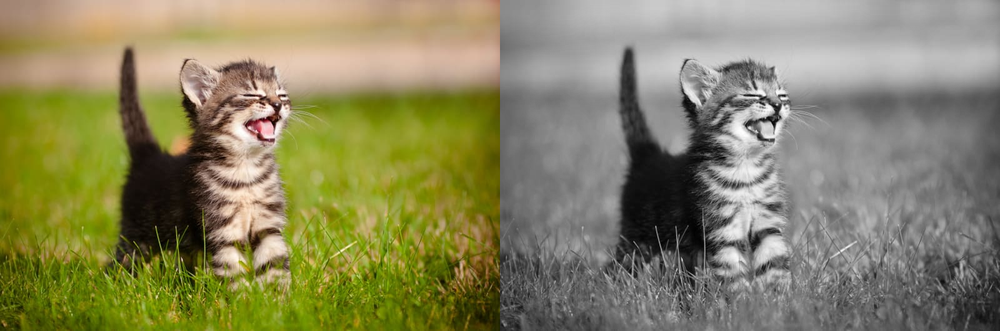

In [13]:
gray_luminance = (0.299*original[:,:,2] + 0.587*original[:,:,1] + 0.114*original[:,:,0]).astype(np.uint8)
print("4c. Grayscale Luminance")
cv2_imshow(cv.hconcat([original, cv.cvtColor(gray_luminance, cv.COLOR_GRAY2BGR)]))

5. Show certain colors in the image , and change other colors to grayscale.

5. Tampilkan satu warna tertentu (Biru)


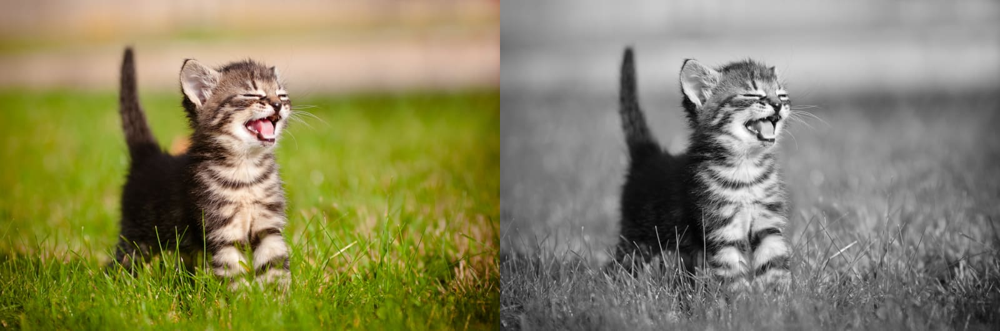

In [14]:
# Konversi ke HSV
hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

# Define
lower_blue = np.array([100, 100, 100])
upper_blue = np.array([140, 255, 255])

# mask for the blue color
mask = cv.inRange(hsv, lower_blue, upper_blue)

# grayscale image from the original
gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

# Combine
result = np.where(mask[:,:,None] != 0, original, gray_bgr)
final_frame = cv.hconcat([original, result])
print("5. Tampilkan satu warna tertentu (Biru)")
cv2_imshow(final_frame)